In this file I want to run the CG algorithm and the FBP algorithm on the phantom to see how it works out. Additionally, trials with regularization will be done.

## Installing packages and setting defaults

In [88]:
# retrieving needed packages

# cil imports
from cil.framework import ImageData, ImageGeometry
from cil.framework import AcquisitionGeometry, AcquisitionData

from cil.processors import Slicer, AbsorptionTransmissionConverter, TransmissionAbsorptionConverter

from cil.optimisation.functions import IndicatorBox, TotalVariation
from cil.optimisation.algorithms import CGLS, SIRT
from cil.optimisation.utilities import callbacks

from cil.plugins.astra.operators import ProjectionOperator
from cil.plugins.astra.processors import FBP
from cil.optimisation.algorithms import FISTA

from cil.plugins.ccpi_regularisation.functions import FGP_TV


#from cil.plugins import TomoPhantom
from phantominator import shepp_logan


from cil.utilities import dataexample
from cil.utilities.display import show2D, show1D, show_geometry

# External imports
import numpy as np
import matplotlib.pyplot as plt
import logging


from cil.optimisation.functions import IndicatorBox, MixedL21Norm, L2NormSquared, \
                                       BlockFunction, L1Norm, LeastSquares, \
                                       OperatorCompositionFunction, TotalVariation 

from cil.optimisation.algorithms import GD, FISTA, PDHG

from cil.optimisation.operators import BlockOperator, GradientOperator,\
                                       GradientOperator, IdentityOperator

In [59]:
# Set logging level for CIL processors:
logging.basicConfig(level=logging.WARNING)
cil_log_level = logging.getLogger('cil.processors')
cil_log_level.setLevel(logging.INFO)

In [60]:
# Setting background defaults

cmap = "rainbow"
device = "cpu"

## Setting up problem and adding noise

In [61]:
# number of pixels and number of angles
n_pixels = 256
n_angles = 50

# Angles
angles = np.linspace(0, 180, n_angles, endpoint=False, dtype=np.float32)

# Setup acquisition geometry

# Note that if number of pixels and number of angels are equal, 
# the matrix is square and an exact solution can be found, 
# then there is a sufficient number of pojections
ag = AcquisitionGeometry.create_Parallel2D()\
                            .set_angles(angles)\
                            .set_panel(n_pixels, pixel_size=1/n_pixels)

# Setup image geometry
ig = ImageGeometry(voxel_num_x=n_pixels, 
                   voxel_num_y=n_pixels, 
                   voxel_size_x=1/n_pixels, 
                   voxel_size_y=1/n_pixels)

# Get phantom
phantom = ImageData(np.flip(shepp_logan(n_pixels)), geometry = ig)

c:\Users\femke\anaconda3\envs\cil_demos_cpu\Lib\site-packages\cil\framework\data_container.py:112: UserWarning: Over-riding geometry.dtype with data.dtype
  warnings.warn("Over-riding geometry.dtype with data.dtype", UserWarning)


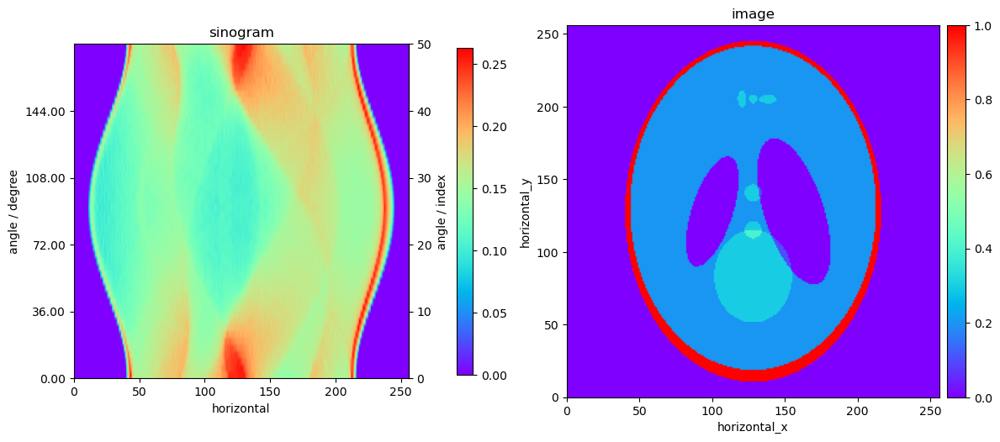

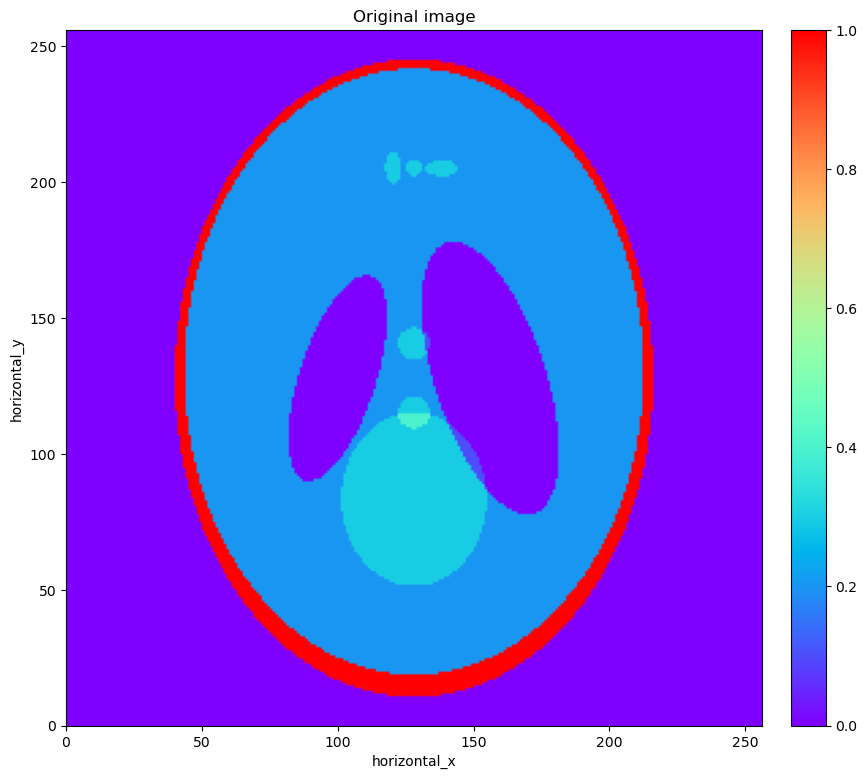

In [62]:
# Show the picture of the example that will be worked with in this code

# Create projection operator using Astra-Toolbox.
A = ProjectionOperator(ig, ag, device)

# Create an acquisition data (numerically)
sino = A.direct(phantom)

show2D([sino, phantom], ['sinogram', 'image'], cmap=cmap, size=(12,6))
show2D([phantom], ['Original image'], cmap=cmap)

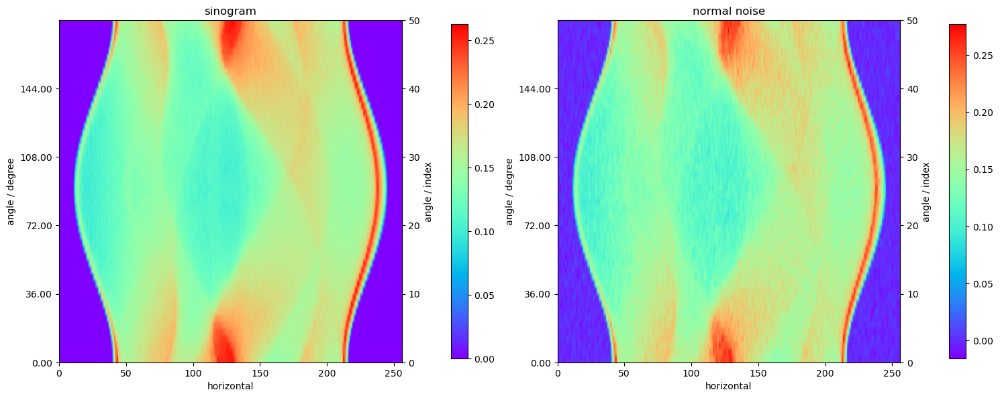

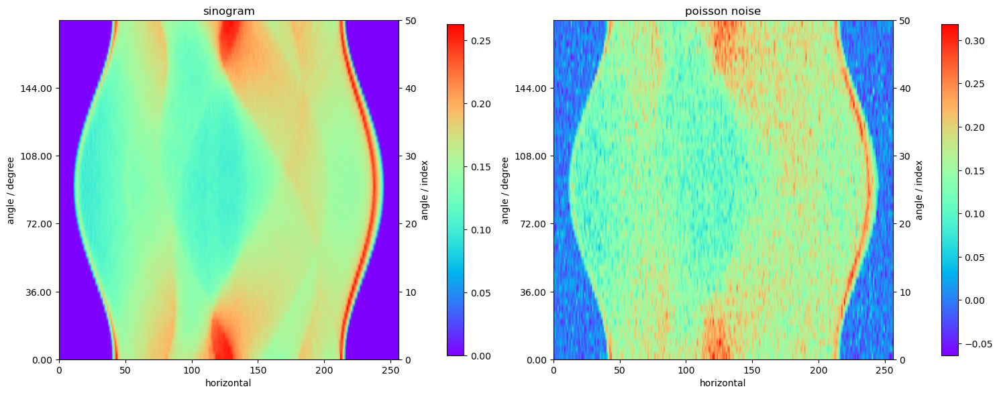

In [63]:
# adding noise to the sinogram

# Incident intensity: lower counts will increase the noise
background_counts_norm = 200
background_counts_poss = 2000

# Convert the simulated absorption sinogram to transmission values using Lambert-Beer. 
counts_norm = background_counts_norm * np.exp(-sino.as_array())
counts_poss = background_counts_poss * np.exp(-sino.as_array())

# Use as mean for Normal data generation.
noisy_counts_norm = np.random.normal(counts_norm)
nonzero = noisy_counts_norm > 0

# Use as a mean for Poisson data generation.
noisy_counts_poss = np.random.poisson(counts_poss)
nonzero = noisy_counts_poss > 0

# Convert back to absorption sinogram.
sino_out_norm = np.zeros_like(sino.as_array())
sino_out_poss = np.zeros_like(sino.as_array())

sino_out_norm[nonzero] = -np.log(noisy_counts_norm[nonzero] / background_counts_norm)
sino_out_poss[nonzero] = -np.log(noisy_counts_poss[nonzero]/ background_counts_poss)

# allocate sino_noisy and fill with noisy data
sino_noisy_norm = ag.allocate()
sino_noisy_norm.fill(sino_out_norm)

sino_noisy_poss = ag.allocate()
sino_noisy_poss.fill(sino_out_poss)

show2D([sino, sino_noisy_norm], ['sinogram', 'normal noise'], cmap=cmap)
show2D([sino, sino_noisy_poss], ['sinogram', 'poisson noise'], cmap=cmap)

## Solving with FBP

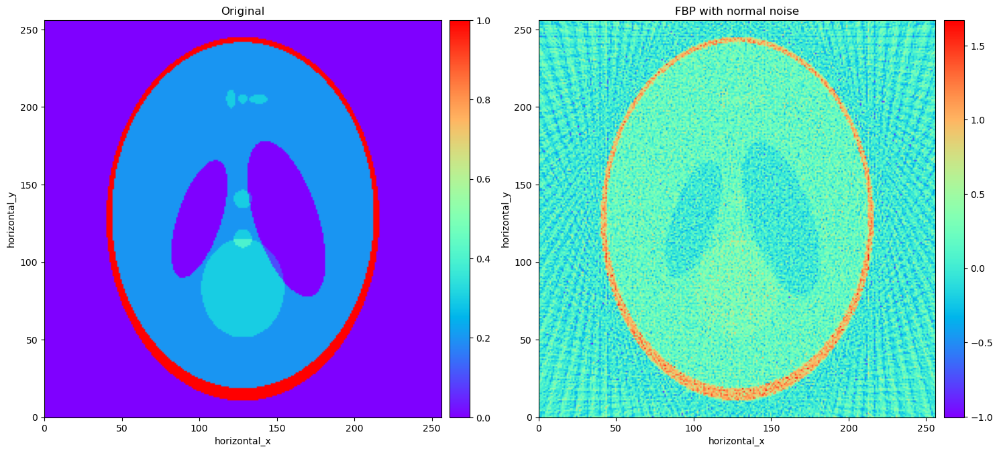

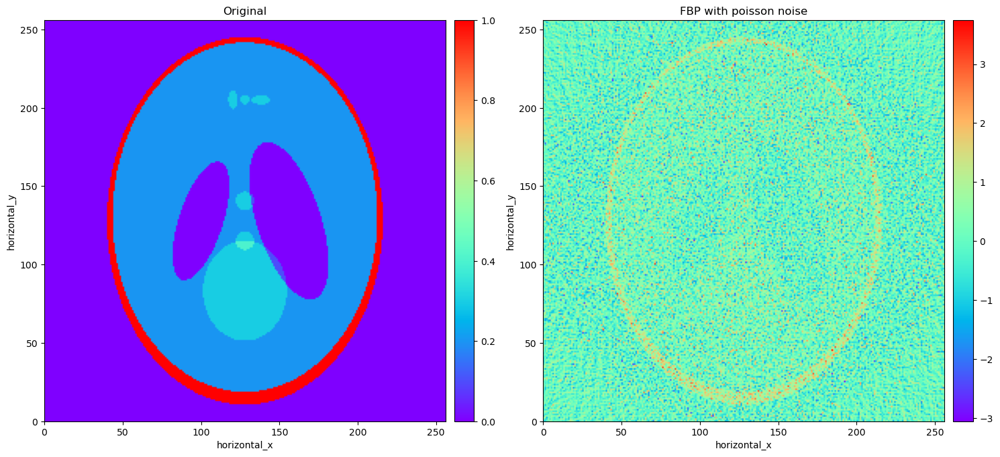

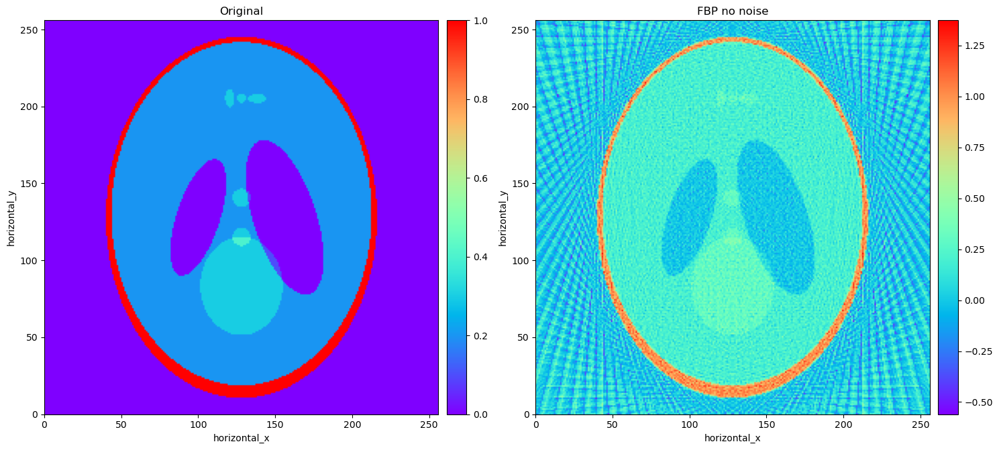

In [64]:
# reconstructing using FBP

# configure FBP
fbp = FBP(ig, ag, device)

# run on the AcquisitionData normal noise
recon_fbp_noisy_norm = fbp(sino_noisy_norm)

# run on the AcquisitionData poisson noise
recon_fbp_noisy_poss = fbp(sino_noisy_poss)

# run on the AcqusitionData without noise
recon_fbp = fbp(sino)

show2D([phantom, recon_fbp_noisy_norm], ['Original', 'FBP with normal noise'], cmap=cmap)
show2D([phantom, recon_fbp_noisy_poss], ['Original', 'FBP with poisson noise'], cmap=cmap)
show2D([phantom, recon_fbp], ['Original', 'FBP no noise'], cmap=cmap)

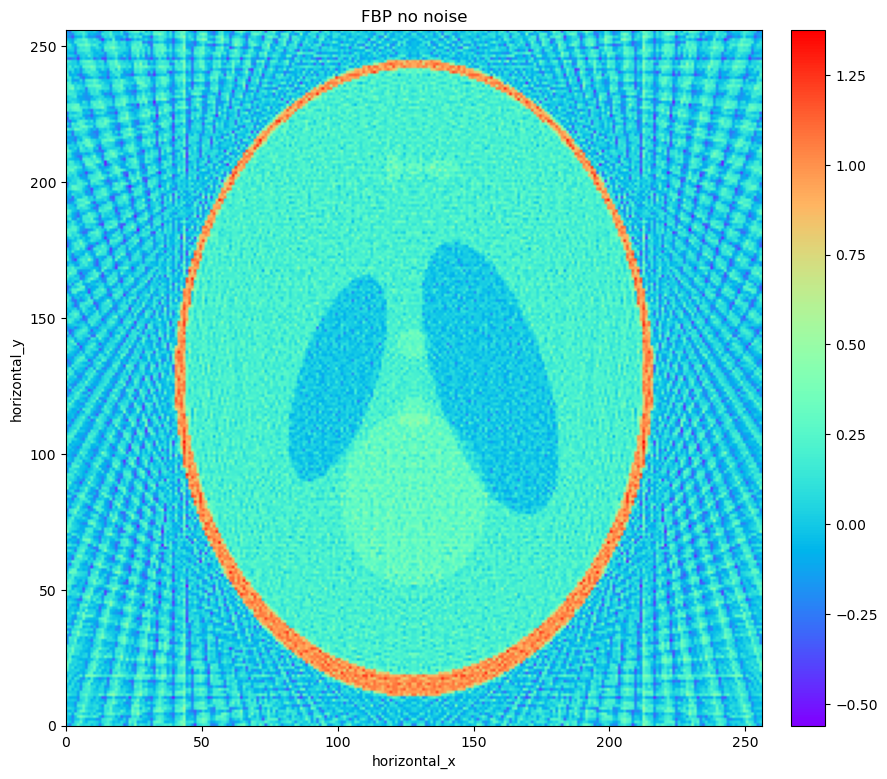

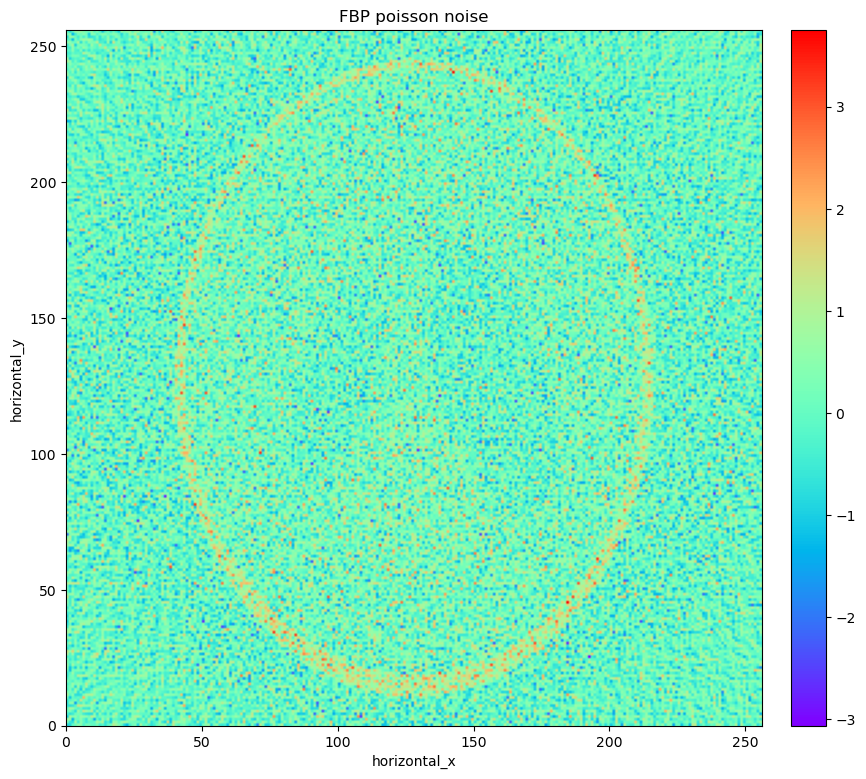

In [65]:
show2D([recon_fbp], ['FBP no noise'], cmap=cmap)
show2D([recon_fbp_noisy_poss], ['FBP poisson noise'], cmap=cmap)

## Solving via Least Squares

In [66]:
# setting up data fidelity term and starting point

f1 = LeastSquares(A, sino)
f1_poss = LeastSquares(A, sino_noisy_poss)
f1_norm = LeastSquares(A, sino_noisy_norm)

x0 = ig.allocate(0.0)

In [67]:
# no regularisation, no noise with GD

myGD_LS = GD(initial=x0, 
             f=f1, 
             step_size=None, 
             update_objective_interval=10)

myGD_LS.run(300, verbose=1)
myGD_LS_reco = myGD_LS.solution

  0%|          | 0/300 [00:00<?, ?it/s]

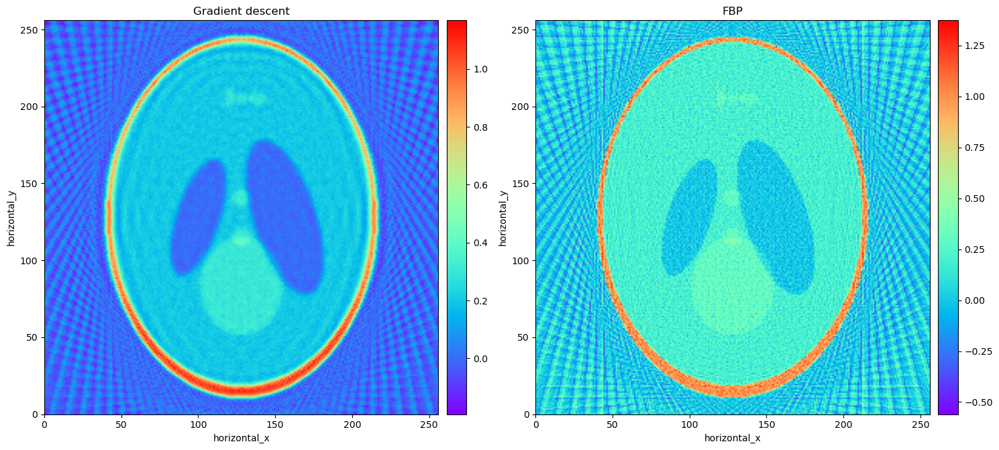

In [68]:
show2D([myGD_LS_reco, recon_fbp], ['Gradient descent', 'FBP'], cmap=cmap)

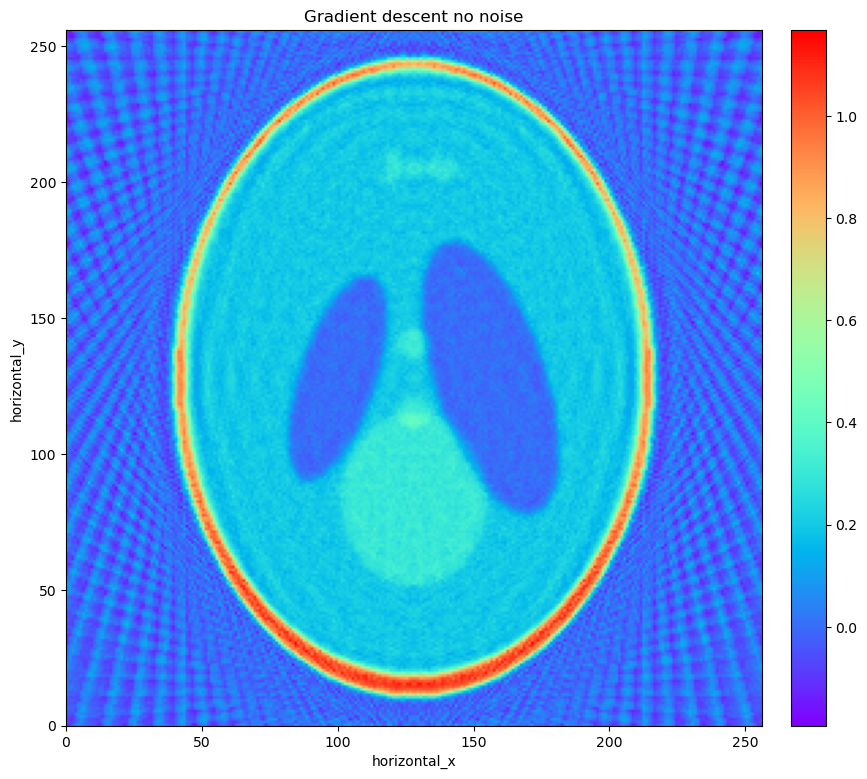

In [69]:
show2D([myGD_LS_reco], ['Gradient descent no noise'], cmap=cmap)

In [70]:
# no regularisation, poisson noise with GD

myGD_LS_poss = GD(initial=x0, 
             f=f1_poss, 
             step_size=None, 
             update_objective_interval=10)

myGD_LS_poss.run(300, verbose=1)
myGD_LS_poss_redo = myGD_LS_poss.solution

  0%|          | 0/300 [00:00<?, ?it/s]

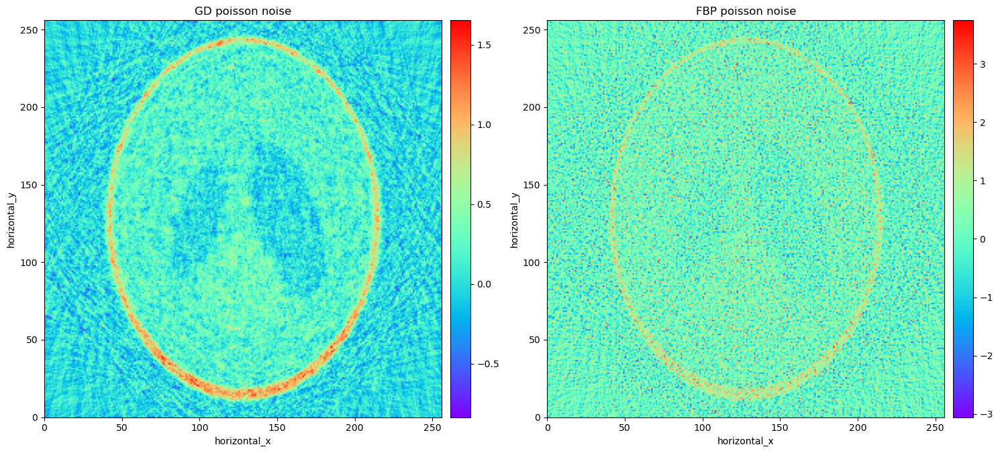

In [71]:
show2D([myGD_LS_poss_redo, recon_fbp_noisy_poss], ['GD poisson noise', 'FBP poisson noise'], cmap=cmap)

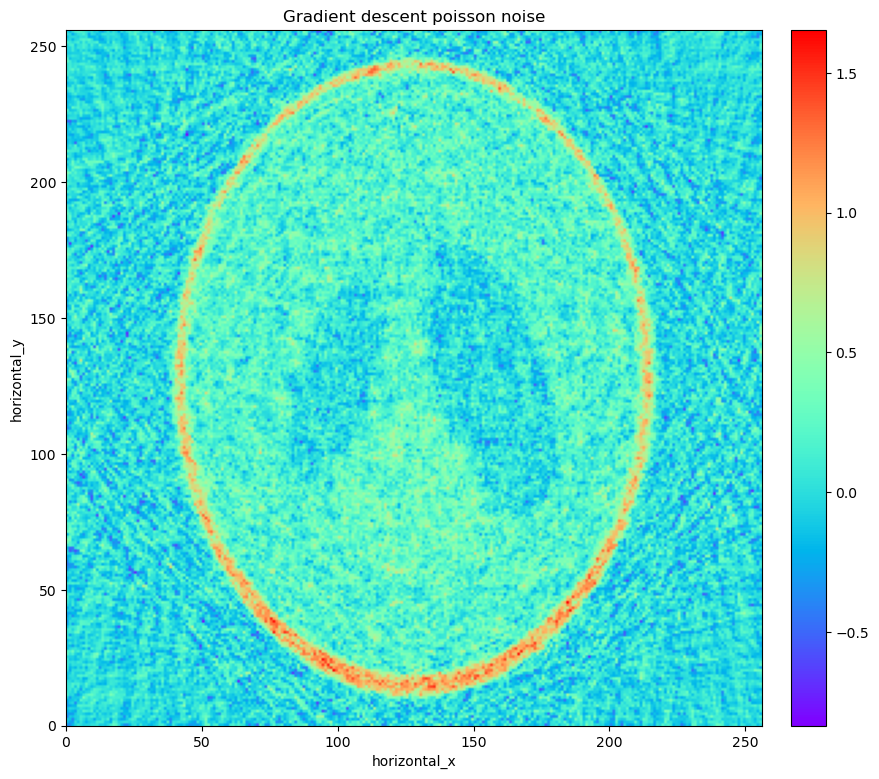

In [72]:
show2D([myGD_LS_poss_redo],['Gradient descent poisson noise'], cmap=cmap)

## Adding in regularization

Now we solve a least squares problem with Tikhonov regularization, that is the minimization problem becomes
\begin{equation}
\min_{u}\|Au - b\|_2^2 + \alpha^2 \|Du\|_2^2
\end{equation}
In here $D$ is the gradient operator $\triangledown$ and $\alpha$ is the regularization parameter.

In [73]:
# setting tikhonov regularisation term
D = GradientOperator(ig)
f2_tik = OperatorCompositionFunction(L2NormSquared(),D)

  0%|          | 0/300 [00:00<?, ?it/s]

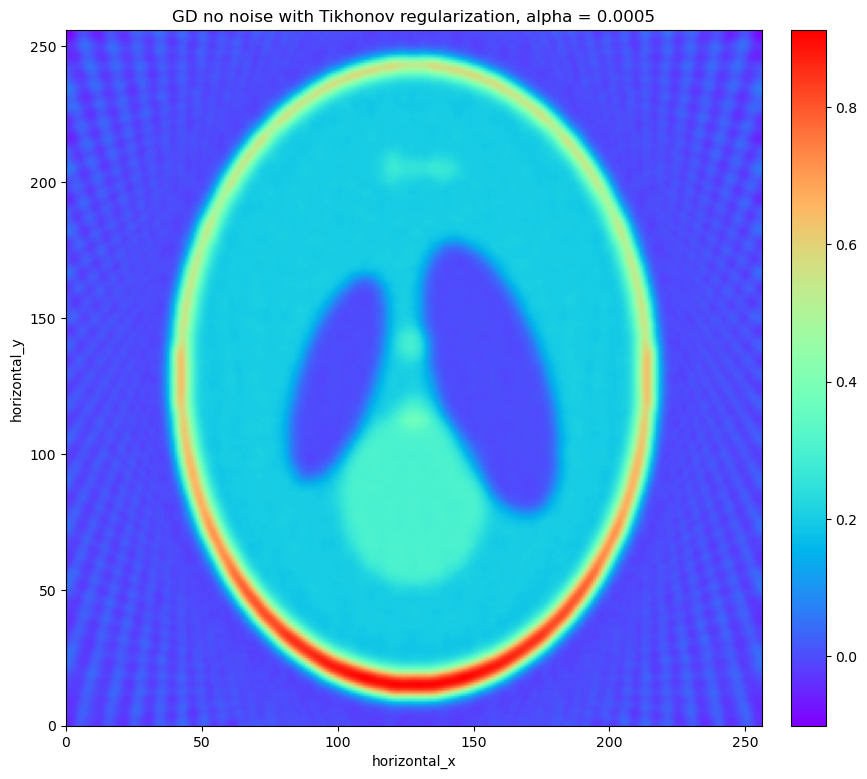

In [121]:
# trying some different values for alpha
alpha_values = np.array([0.0005])

for alpha in alpha_values:
    f_tik = f1 + (alpha**2)*f2_tik

    myGD_LS_tik = GD(initial=x0, 
                f=f_tik, 
                step_size=1/f_tik.L,    # does not run without this stepsize  
                update_objective_interval=10)

    myGD_LS_tik.run(300, verbose=1)
    show2D([myGD_LS_tik.solution], cmap=cmap, title=f'GD no noise with Tikhonov regularization, alpha = {alpha}')

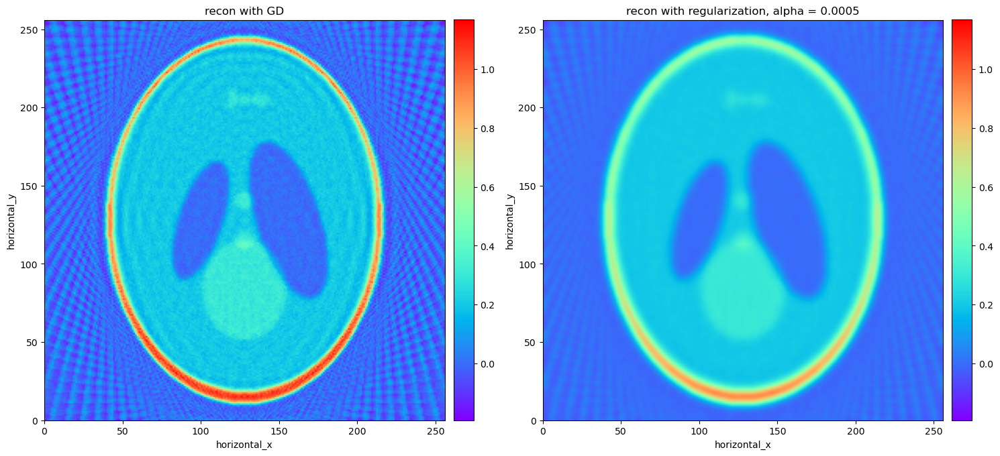

In [122]:
show2D([myGD_LS.solution, myGD_LS_tik.solution], ['recon with GD', f'recon with regularization, alpha = {alpha}'], cmap=cmap, fix_range=True)

Now we add noise

In [ ]:
alpha = 0.0002
f_tik_poss = f1_poss + alpha**2*f2_tik

myGD_LS_tik_poss = GD(initial=x0, 
             f=f_tik_poss, 
             step_size=1/f_tik_poss.L, 
             update_objective_interval=10)

myGD_LS_tik_poss.run(300, verbose=1)
myGD_LS_tik_poss_reco = myGD_LS_tik_poss.solution

  0%|          | 0/300 [00:00<?, ?it/s]

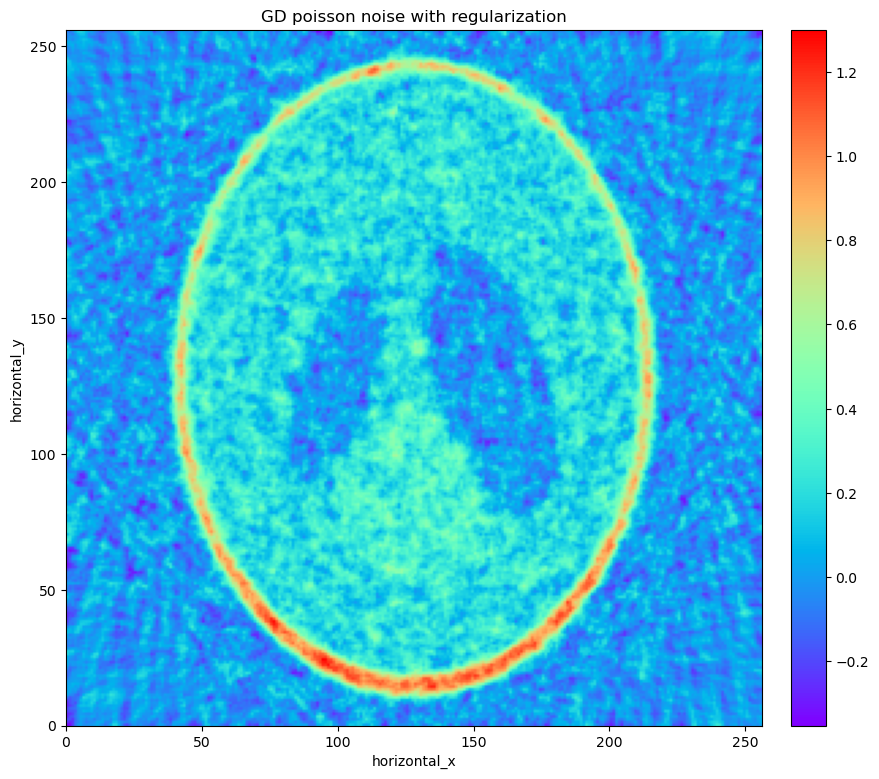

In [77]:
show2D([myGD_LS_tik_poss_reco], ['GD poisson noise with regularization'], cmap=cmap)

In [78]:
#show2D([myGD_LS_tik.solution, myGD_LS_tik_poss.solution], ['GD poisson regularization', 'GD poisson noise with regularization'], cmap=cmap)

## Total variation regularization

For this we need to run with FISTA. To compare equally, we run the other programmes with FISTA as well

In [109]:
# I dont think I understand it, but can try
alpha = 0.0001

G = IndicatorBox(lower=0.0)
TV = FGP_TV(alpha=alpha, nonnegativity=True, device='cpu')

fista_TV = FISTA(initial=x0, f=f1, g=TV, update_objective_interval=10)

 50%|#####     | 101/200 [00:00<?, ?it/s]

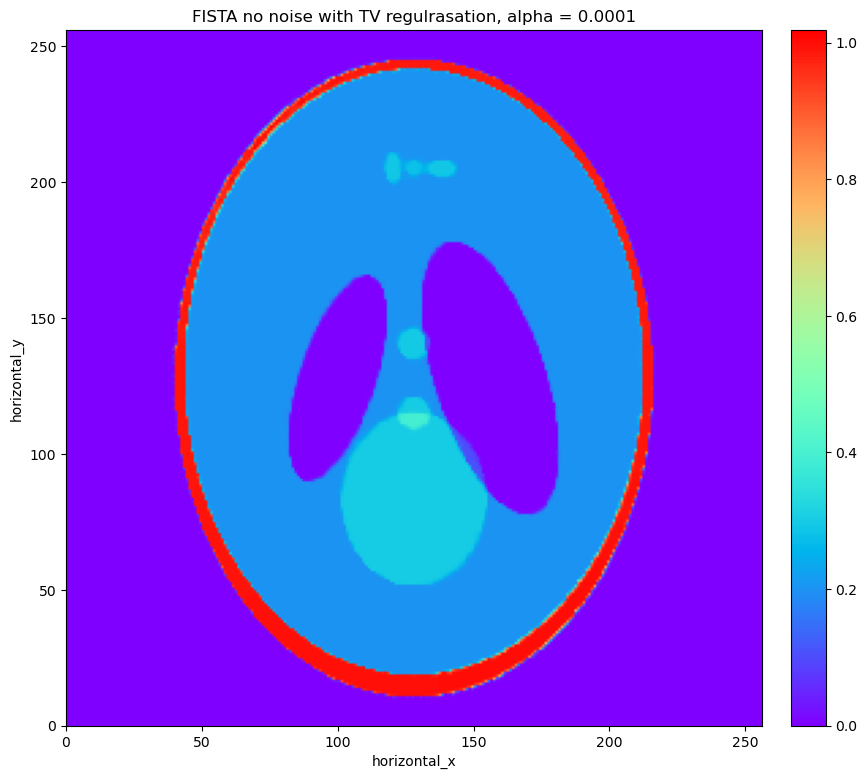

In [111]:
fista_TV.run(100)

TV_reco = fista_TV.solution
show2D([TV_reco], [f'FISTA no noise with TV regulrasation, alpha = {alpha}'], cmap=cmap)

TV regularisation, but try with GD

In [ ]:
alpha = 0.0002
f2_tv = OperatorCompositionFunction(TotalVariation(10), IdentityOperator)
print(type(f2_tv), type(f2_tik))

f_tv = f1 + alpha**2*f2_tv

myGD_LS_tik_poss = GD(initial=x0, 
             f=f_tv, 
             step_size=None, 
             update_objective_interval=10)

myGD_LS_tik_poss.run(300, verbose=1)
myGD_LS_tik_poss_reco = myGD_LS_tik_poss.solution

<class 'cil.optimisation.functions.OperatorCompositionFunction.OperatorCompositionFunction'> <class 'cil.optimisation.functions.OperatorCompositionFunction.OperatorCompositionFunction'>


c:\Users\femke\anaconda3\envs\cil_demos_cpu\Lib\site-packages\cil\optimisation\functions\OperatorCompositionFunction.py:26: SyntaxWarning: invalid escape sequence '\c'
  """ Composition of a function with an operator as : :math:`(F \circ A)(x) = F(Ax)`


TypeError: IdentityOperator.direct() missing 1 required positional argument: 'x'